# 案例：股票收益率预测


<div class="alert alert-block alert-success">
本案例研究将利用3种（LR、ARIMA、RNN）模型，结合股票的相关资产及其自身历史数据，来预测其股票价格。通过本案例研究，将熟悉股票预测建模的一般机器学习方法，涵盖从数据收集和清理，到构建和调整不同模型的整个过程。
</div>


金融领域面临的最大挑战之一就是预测股票价格。然而，随着近期机器学习应用的飞速发展，该领域正在演变为利用非确定性解决方案进行学习，以做出更准确的预测。机器学习技术天然适用于基于历史数据进行股票价格预测。预测可以针对单个未来时间点或一系列未来时间点进行。

## 1. 问题定义

### 1.1 问题描述

预测股票收益率的问题可以在不同的时间尺度和预测目标下进行定义。一般来说，预测股票收益率的问题可以定义为：

1. **时间尺度**：
   - 短期预测：预测未来短期内（如下一个交易日、一周或一个月）股票的收益率变化。
   - 长期预测：预测未来较长时间内（如半年、一年或更长时间）股票的累积收益率或年化收益率。
本文选择周收益率作为预测变量。

2. **预测目标**：
   - 方向性预测：预测股票收益率的变化方向，即涨跌预测。
   - 绝对值预测：预测股票收益率的具体数值，通常以百分比或单位价格变化为单位。


### 1.2 影响股票收益率预测的因素


除了股票本身的历史价格和收益率之外，通常用于股票价格预测的特征如下：

- 相关资产

一个组织依赖并与许多外部因素互动，包括其竞争对手、客户、全球经济、地缘政治局势、财政和货币政策、获得资本等。因此，其股价可能不仅与其他公司的股价相关，还可能与其他资产相关，例如商品、外汇、广泛指数甚至固定收益证券。

- 技术指标

许多投资者遵循技术指标。移动平均线、指数移动平均线和动量是最流行的指标。

- 基本面分析

用于收集可用于基本面分析的特征的两个主要数据源包括：

- 业绩报告

公司年度和季度报告可以用来提取或确定关键指标，例如 ROE（股本回报率）和 P/E（市盈率）。

- 新闻

新闻可以预示可能导致股价朝特定方向移动的即将发生的事件。

### 1.3 数据和样本的选择

本案例，我们选择预测**微软公司**股票价格的收益率，所以我们还需要哪些影响微软股价的因素，并将尽可能多的信息纳入模型中。所以，本案例使用的自变量（除微软历史数据以外）为以下可能相关的资产：

- 股票：IBM (IBM)股票 和 Alphabet (GOOGL)股票

- 汇率：USD/JPY（美元兑日元） 和 GBP/USD（英镑兑美元）汇率

- 指数：S&P 500指数、道琼斯指数和 VIX指数

本案例研究使用的数据集来自Wind数据库，我们将使用 2010 年至今的每日收盘价。



## 2. 载入数据集

首先我们使用pandas读取CSV文件的方法，把从Wind终端下载的数据加载到内存中，并指定第0列为行索引。

In [1]:
import pandas as pd
data = pd.read_csv('datasets/case01.csv', index_col=0)
data.index = pd.to_datetime(data.index)
data.head()

,MSFT.O,IBM.N,GOOGL.O,SPX.GI,VIX.GI,DJI.GI,USDJPY.FX,GBPUSD.FX
DateTime,,,,,,,,
2010-01-04,23.610089,76.698443,15.683935,1132.99,20.04,10583.96,92.52,1.6089
2010-01-05,23.617718,75.771924,15.614868,1136.52,19.35,10572.02,91.68,1.5991
2010-01-06,23.472777,75.279710,15.221237,1137.14,19.16,10573.68,92.32,1.6015
2010-01-07,23.230192,75.019127,14.866894,1141.69,19.06,10606.86,93.31,1.5933
2010-01-08,23.388864,75.771924,15.065086,1144.98,18.13,10618.19,92.66,1.6019


为了让列名变得简洁，我们可以使用以下方法：

In [2]:
tickers={'MSFT.O':'MSFT','IBM.N':'IBM','GOOGL.O':'GOOGL','SPX.GI':'SPX',
         'VIX.GI':'VIX','DJI.GI':'DJI','USDJPY.FX':'USDJPY','GBPUSD.FX':'GBPUSD'}
data.columns = [tickers[i] for i in data.columns]
data.head()

,MSFT,IBM,GOOGL,SPX,VIX,DJI,USDJPY,GBPUSD
DateTime,,,,,,,,
2010-01-04,23.610089,76.698443,15.683935,1132.99,20.04,10583.96,92.52,1.6089
2010-01-05,23.617718,75.771924,15.614868,1136.52,19.35,10572.02,91.68,1.5991
2010-01-06,23.472777,75.279710,15.221237,1137.14,19.16,10573.68,92.32,1.6015
2010-01-07,23.230192,75.019127,14.866894,1141.69,19.06,10606.86,93.31,1.5933
2010-01-08,23.388864,75.771924,15.065086,1144.98,18.13,10618.19,92.66,1.6019


In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 3444 entries, 2010-01-04 to 2024-03-08
Data columns (total 8 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   MSFT    3444 non-null   float64
 1   IBM     3444 non-null   float64
 2   GOOGL   3444 non-null   float64
 3   SPX     3444 non-null   float64
 4   VIX     3444 non-null   float64
 5   DJI     3444 non-null   float64
 6   USDJPY  3444 non-null   float64
 7   GBPUSD  3444 non-null   float64
dtypes: float64(8)
memory usage: 242.2 KB


观察数据，我们总共拥有3444个时间点，包含8个相关的时间序列，数据类型为`float64`类型，并且无空值`non-null`。

### 2.1 对数收益率的计算

在本文中，我们定义了因变量（Y）和自变量（X）。所预测的变量为微软（MSFT）的每周回报。我们假设一周内的交易日数为五天，使用五个交易日来计算回报。

In [4]:
import numpy as np
return_period = 5
Y = np.log(data.loc[:, 'MSFT']).diff(return_period).shift(-return_period)
Y.name = Y.name+'_pred'
Y

DateTime
2010-01-04   -0.022216
2010-01-05   -0.029168
2010-01-06   -0.013744
2010-01-07    0.016544
2010-01-08    0.006502
                ...   
2024-03-04         NaN
2024-03-05         NaN
2024-03-06         NaN
2024-03-07         NaN
2024-03-08         NaN
Name: MSFT_pred, Length: 3444, dtype: float64

### 2.2 更多自变量

对于自变量，我们使用相关资产和微软（MSFT）的历史回报，以不同频率进行计算。作为自变量使用的变量包括股票（IBM 和 GOOG）、货币（USD/JPY 和 GBP/USD）以及指数（标普500、道琼斯和VIX）的滞后五日回报，以及微软（MSFT）的滞后5日、15日、30日和60日回报。滞后五日变量采用时间延迟方法，将时间序列组件嵌入其中，其中滞后变量被包含为自变量之一。这一步骤将时间序列数据重新构建为基于监督回归的模型框架。

In [5]:
X1 = np.log(data.loc[:, ['GOOGL', 'IBM']]).diff(return_period)
X2 = np.log(data.loc[:, ['USDJPY', 'GBPUSD']]).diff(return_period)
X3 = np.log(data.loc[:, ['SPX', 'VIX','DJI']]).diff(return_period)

In [6]:
return_period = 5
X4 = pd.concat([np.log(data.loc[:, 'MSFT']).diff(i) for i in [return_period, return_period*3, return_period*6, return_period*12]], axis=1)
X4 = X4.dropna()
X4.columns = ['MSFT_5DT', 'MSFT_15DT', 'MSFT_30DT', 'MSFT_60DT']

In [7]:
dataset = pd.concat([Y, X1, X2, X3, X4], axis=1).dropna()
dataset = dataset.iloc[::return_period, :]   # 间隔采用，采用频率为return_period
y = dataset.loc[:, 'MSFT_pred']
X = dataset.loc[:, dataset.columns[1:]]

变量 MSFT_pred 是微软股票的回报，也是预测变量。数据集包含了其他相关股票、货币和指数的滞后系列。此外，它还包括微软历史回报的滞后数据。

In [8]:
pd.set_option('display.precision', 5)
dataset.head()

,MSFT_pred,GOOGL,IBM,USDJPY,GBPUSD,SPX,VIX,DJI,MSFT_5DT,MSFT_15DT,MSFT_30DT,MSFT_60DT
DateTime,,,,,,,,,,,,
2010-04-06,0.03782,0.01021,0.00264,0.01310,0.01878,0.01373,-0.08047,0.00678,-0.00917,0.00102,0.02033,-0.04944
2010-04-13,0.02945,0.03212,0.00078,-0.00599,0.00764,0.00659,-0.00185,0.00450,0.03782,0.02831,0.04810,0.01059
2010-04-20,-0.01656,-0.05559,0.00510,0.00000,0.00007,0.00821,-0.02944,0.00882,0.02945,0.05810,0.09108,0.02074
2010-04-27,-0.03279,-0.04794,-0.00673,-0.00118,-0.00875,-0.01963,0.37163,-0.01131,-0.01656,0.05070,0.05173,0.05537
2010-05-05,-0.01383,-0.03716,-0.01061,0.00930,-0.00949,-0.01516,0.08807,-0.01133,-0.03279,-0.01990,0.00841,0.05411



## 3. 探索性数据分析


### 3.1. 描述性统计

我们观察下数据集

In [9]:
dataset.describe()

,MSFT_pred,GOOGL,IBM,USDJPY,GBPUSD,SPX,VIX,DJI,MSFT_5DT,MSFT_15DT,MSFT_30DT,MSFT_60DT
count,676.00000,676.00000,676.00000,676.00000,676.00000,676.00000,676.00000,676.00000,676.00000,676.00000,676.00000,676.00000
mean,0.00427,0.00339,0.00134,0.00072,-0.00025,0.00217,-0.00040,0.00189,0.00427,0.01281,0.02564,0.05055
std,0.03487,0.03708,0.03068,0.01326,0.01375,0.02355,0.15319,0.02299,0.03487,0.05434,0.07269,0.09706
min,-0.17871,-0.16790,-0.23118,-0.04468,-0.12155,-0.19804,-0.46535,-0.20872,-0.17871,-0.28231,-0.24938,-0.22660
25%,-0.01475,-0.01580,-0.01326,-0.00608,-0.00813,-0.00705,-0.08306,-0.00760,-0.01475,-0.01942,-0.01921,-0.01174
50%,0.00697,0.00448,0.00231,0.00099,0.00039,0.00432,-0.00994,0.00278,0.00697,0.01571,0.03072,0.05661
75%,0.02479,0.02422,0.01849,0.00833,0.00780,0.01377,0.06658,0.01376,0.02479,0.04726,0.07185,0.11523
max,0.14003,0.17421,0.11785,0.06842,0.06080,0.09898,0.96013,0.11575,0.14003,0.17239,0.24615,0.35027



### 3.2. 数据可视化

了解数据的最快方法是通过可视化。可视化包括独立理解数据集的每个属性。我们将查看散点图和相关系数矩阵。这些图形让我们感受到数据之间的相互依赖关系。通过创建相关系数矩阵，可以计算并显示每对变量之间的相关性。因此，除了独立变量和因变量之间的关系，它还显示了独立变量之间的相关性。这是有用的，因为在数据中存在高度相关的输入变量时，一些机器学习算法如线性回归和逻辑回归可能表现不佳。

接下来，让我们来看一下整个时期的数据分布情况。

In [10]:
import matplotlib.pyplot as plt
plt.rcParams['font.sans-serif'] = 'Songti SC'  # 设置字体为宋体
plt.rcParams['axes.unicode_minus'] = False  # 解决负号“-”显示异常
from matplotlib_inline import backend_inline
backend_inline.set_matplotlib_formats('svg') 


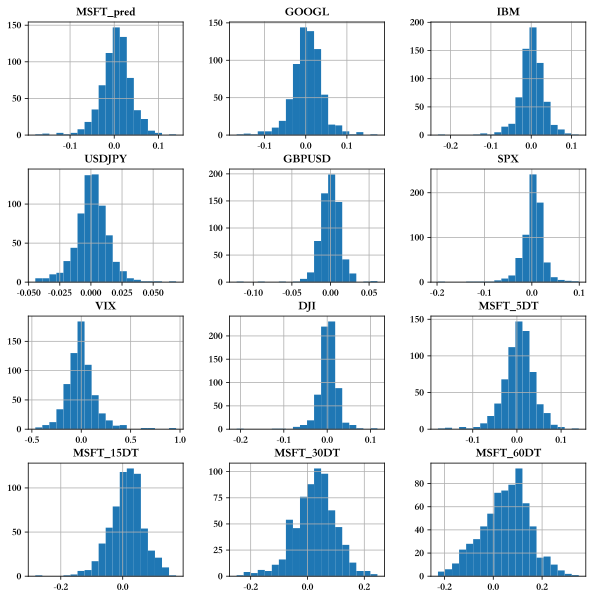

In [11]:
import seaborn as sns
dataset.hist(bins=20, sharex=False, sharey=False, figsize=(10,10))
plt.show()

We can see that the vix has a much larger variance compared to the other distributions.

<Axes: title={'center': 'Correlation Matrix'}>

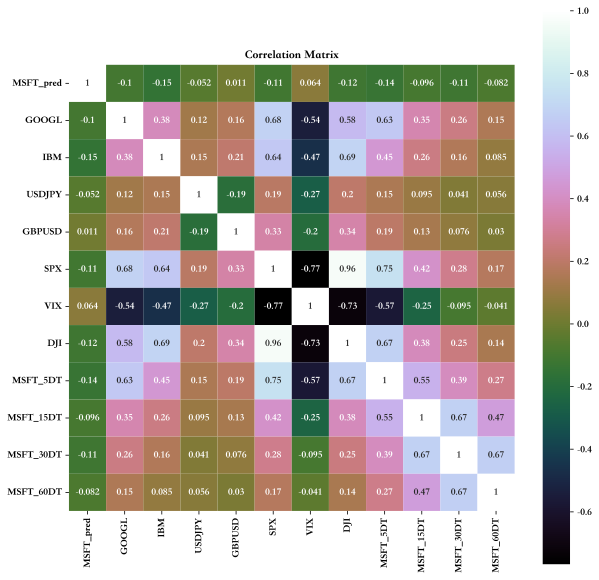

In [12]:
correlation = dataset.corr()
plt.figure(figsize=(10,10))
plt.title('Correlation Matrix')
sns.heatmap(correlation, vmax=1, square=True,annot=True,cmap='cubehelix')

观察相关性图（GitHub 上提供完整尺寸版本），我们可以看到预测变量与微软（MSFT）的滞后5天、15天、30天和60天的回报之间存在一定的相关性。此外，我们还可以看到许多资产回报与VIX之间的较高负相关性，这是很直观的。接下来，我们可以使用下面显示的散点图矩阵来可视化回归中所有变量之间的关系。

In [13]:
from pandas.plotting import scatter_matrix
scatter_matrix(dataset,figsize=(12,12))
plt.show()

观察散点图，我们可以看到预测变量与微软（MSFT）的滞后15天、30天和60天的回报之间存在一些线性关系。除此之外，我们并未观察到预测变量与其他特征之间的特殊关系。

## 4. 划分样本

正如前面章所述，将原始数据集分割为训练集和测试集是一个好主意。测试集是我们从分析和建模中保留的数据样本。我们在项目的最后阶段使用它来确认我们最终模型的性能。这是最终的测试，让我们对未见数据的准确性估计有信心。


### 4.1 随机样本划分

In [14]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y,train_size=0.8,random_state=42)

### 4.2 固定样本划分


我们将使用数据集的80%用于建模，使用20%进行测试。对于时间序列数据，数值的顺序很重要。因此，我们不会随机分配数据集到训练集和测试集中，而是选择有序观测值列表中的任意拆分点，并创建两个新数据集：

In [15]:
validation_size = 0.2
train_size = int(len(X) * (1-validation_size))
X_train, X_test = X[0:train_size], X[train_size:len(X)]
y_train, y_test = y[0:train_size], y[train_size:len(X)]

我们将数据保存到'datasets/'文件夹下，为后面的建模做准备：

In [16]:
X_train.to_csv('datasets/X_train.csv')
X_test.to_csv('datasets/X_test.csv')
y_train.to_csv('datasets/y_train.csv')
y_test.to_csv('datasets/y_test.csv')